# Udacity Self-Driving Car Engineer Nanodegree Program
## Vehicle Detection Project
---
The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.
---

### Import Statements

In [2]:
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# for scikit-learn >= 0.18 use:
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split
from scipy.ndimage.measurements import label
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import pickle
import cv2
import glob
import time

%matplotlib inline

### Load Training Data

In [3]:
car_images = glob.glob('vehicles/**/*.png')
noncar_images = glob.glob('non-vehicles/**/*.png')
print(len(car_images), len(noncar_images))

8792 8968


### Visualize Some of the Data

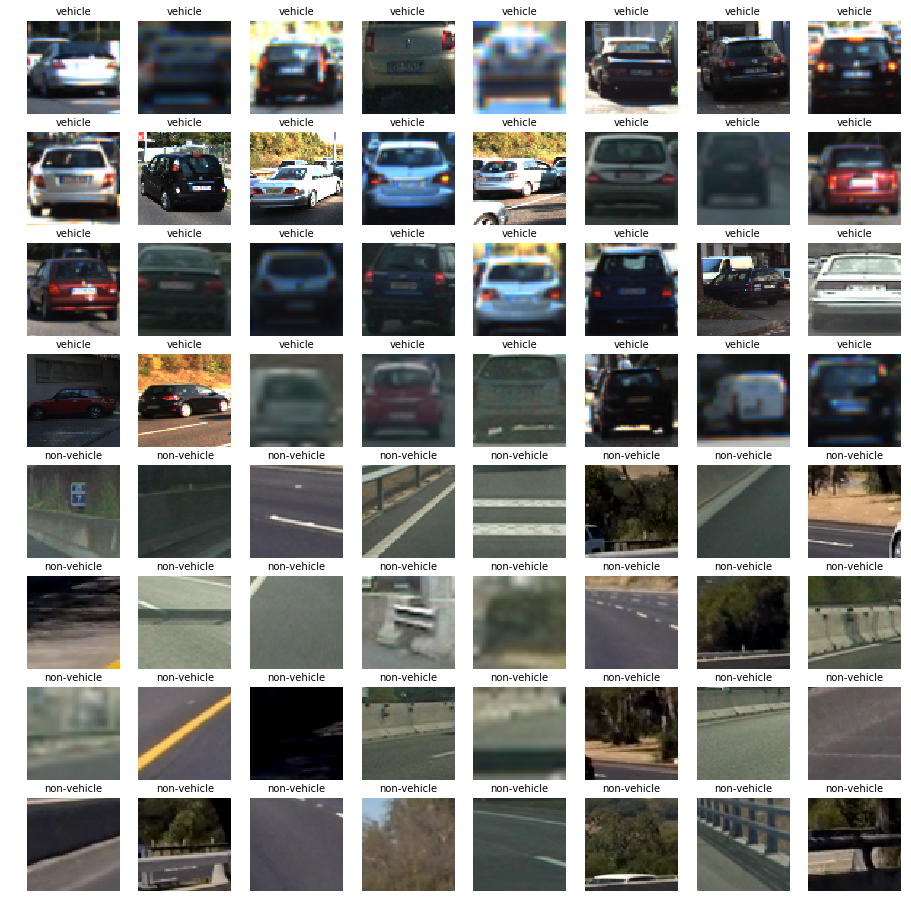

In [4]:
fig, axs = plt.subplots(8,8, figsize=(16, 16))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i in np.arange(32):
    img = cv2.imread(car_images[np.random.randint(0,len(car_images))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('vehicle', fontsize=10)
    axs[i].imshow(img)
for i in np.arange(32,64):
    img = cv2.imread(noncar_images[np.random.randint(0,len(noncar_images))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('non-vehicle', fontsize=10)
    axs[i].imshow(img)

In [5]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

In [6]:
def load_image(path, gray = False):
    extension = path.split('/')[-1].split('.')[-1]
    
    if extension == 'png':
        if gray:
            image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2GRAY)
        else:
            image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    elif extension == 'jpg':
        image = mpimg.imread(path)
        if gray:
            image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
    return image

255


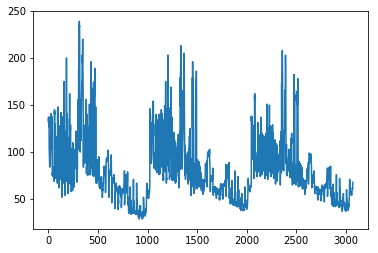

In [7]:
image = load_image(car_images[0])
print(image.max())
feature_vec = bin_spatial(image, size=(32, 32))
plt.plot(feature_vec)

In [8]:
def color_hist(img, nbins=32):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

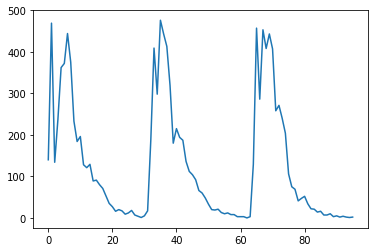

In [9]:
hist_features = color_hist(image, nbins=32)
plt.plot(hist_features)

In [10]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [46]:
# Visualize HOG on example image
car_img = load_image(car_images[100])
_, car_hog = get_hog_features(car_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
noncar_img = load_image(noncar_images[101])
_, noncar_hog = get_hog_features(noncar_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)

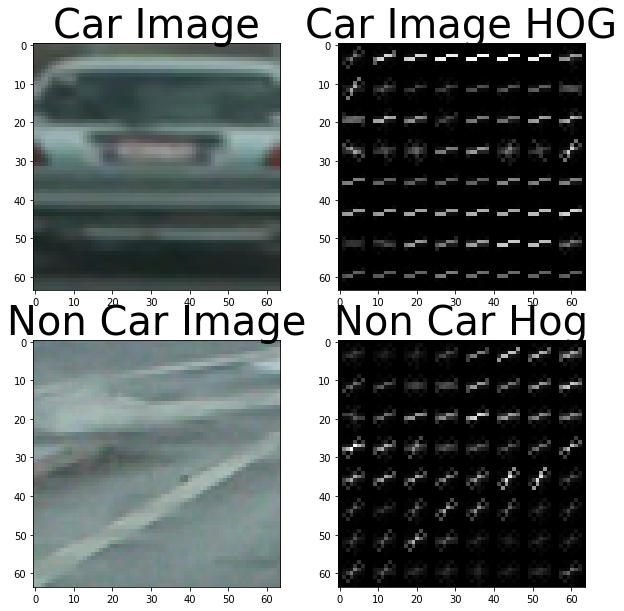

In [51]:
fig = plt.figure(figsize=(10, 10))
a=fig.add_subplot(2,2,1)
a.set_title('Car Image', fontsize=40)
plt.imshow(car_img)
a=fig.add_subplot(2,2,2)
a.set_title('Car Image HOG', fontsize=40)
plt.imshow(car_hog, cmap='gray')
a=fig.add_subplot(2,2,3)
a.set_title('Non Car Image', fontsize=40)
plt.imshow(noncar_img)
a=fig.add_subplot(2,2,4)
a.set_title('Non Car Hog', fontsize=40)
plt.imshow(noncar_hog, cmap='gray')
plt.show()

In [11]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9,
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []

        # png is scale from (0,1)
        image = load_image(file)

        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else:
            feature_image = np.copy(image)

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


In [12]:
# traing classifier and save to pickle file 
sample_size = min(len(car_images), len(noncar_images))
cars = car_images[0:sample_size]
notcars = noncar_images[0:sample_size]
color_space="YCrCb"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32
orient = 9
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block, which can handel e.g. shadows
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_feat = True
hist_feat = True
hog_feat = True

print('filenames are saved!')

print('extracting car features...')
car_features = extract_features(cars, color_space=color_space,
                        spatial_size=spatial_size, hist_bins=hist_bins,
                        orient=orient, pix_per_cell=pix_per_cell,
                        cell_per_block=cell_per_block,
                        hog_channel=hog_channel, spatial_feat=spatial_feat,
                        hist_feat=hist_feat, hog_feat=hog_feat)
print('car features extracted!')
print('extracting noncar features...')
notcar_features = extract_features(notcars, color_space=color_space,
                        spatial_size=spatial_size, hist_bins=hist_bins,
                        orient=orient, pix_per_cell=pix_per_cell,
                        cell_per_block=cell_per_block,
                        hog_channel=hog_channel, spatial_feat=spatial_feat,
                        hist_feat=hist_feat, hog_feat=hog_feat)
print('noncar features extracted!')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

filenames are saved!
extracting car features...
car features extracted!
extracting noncar features...
noncar features extracted!
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
5.4 Seconds to train SVC...
Test Accuracy of SVC =  0.9926


In [13]:
# save classifier
clf_path = 'clf_pickle_all_v1.p'
clf_pickle = {}
clf_pickle["svc"] = svc
clf_pickle["scaler"] = X_scaler
clf_pickle["orient"] = orient
clf_pickle["pix_per_cell"] = pix_per_cell
clf_pickle["cell_per_block"] = cell_per_block
clf_pickle["spatial_size"] = spatial_size
clf_pickle["hist_bins"] = hist_bins
clf_pickle["color_space"] = color_space

destnation = clf_path
pickle.dump( clf_pickle, open( destnation, "wb" ) )
print("Classifier is written into: {}".format(destnation))

Classifier is written into: clf_pickle_all_v1.p


In [14]:
clf_path = 'clf_pickle_all_v1.p'
with open(clf_path, 'rb') as file:
    clf_pickle = pickle.load(file)
    svc = clf_pickle["svc"]
    X_scaler = clf_pickle["scaler"]
    orient = clf_pickle["orient"]
    pix_per_cell = clf_pickle["pix_per_cell"]
    cell_per_block = clf_pickle["cell_per_block"]
    spatial_size = clf_pickle["spatial_size"]
    hist_bins = clf_pickle["hist_bins"]
    color_space = clf_pickle["color_space"]

In [15]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

In [16]:
# Define a function you will pass an image
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB',
                    spatial_size=(32, 32), hist_bins=32, orient=9,
                    pix_per_cell=8, cell_per_block=2,
                    hog_channel=0, spatial_feat=True,
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))  # training image is (64,64)

        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space,
                            spatial_size=spatial_size, hist_bins=hist_bins,
                            orient=orient, pix_per_cell=pix_per_cell,
                            cell_per_block=cell_per_block,
                            hog_channel=hog_channel, spatial_feat=spatial_feat,
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        X = np.array(features).reshape(1, -1)
        test_features = scaler.transform(X)
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows


def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    rectangles = []
    draw_img = np.copy(img)
#     print("max ", img.max())
#     print("shape ", img.shape)
#     img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
#     print("tosearch ", img_tosearch.shape)
    
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
#     print("ctrans shape", ctrans_tosearch.shape)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
#     print("pix  cell ", pix_per_cell)

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
#                 cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    
    return rectangles
#     return draw_img


def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes


def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap


def draw_bboxes(img, heatmap_buffer, heatmap_pre, N_buffer):

    heatmap_buffer.append(heatmap_pre)

    if len(heatmap_buffer) > N_buffer: # remove the first component if it is more than N_buffer elements
        heatmap_buffer.pop(0)

    # weight the heatmap based on current frame and previous N frames
    idxs = range(N_buffer)
    for b, w, idx in zip(heatmap_buffer, buffer_weights, idxs):
        heatmap_buffer[idx] = b * w

    heatmap = np.sum(np.array(heatmap_buffer), axis=0)
    heatmap = apply_threshold( heatmap, threshold= sum(buffer_weights[0:N_buffer])*2)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)

    bboxes = []
    # locate the bounding box
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox_tmp = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        bboxes.append(bbox_tmp)


    for bbox in bboxes:
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 4)

    # Return the image

    return img, heatmap, bboxes


def generate_heatmap(image, windows_list, threshold):

    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat, windows_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, 0)

    # Visualize the heatmap when displaying
    heatmap = np.clip(heat, 0, 255)

    # if np.amax(heatmap) == 0:
    #     flag = False
    # else:
    #     flag = True

    return heatmap

# Here is your draw_boxes function from the previous exercise
# def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
#     # Make a copy of the image
#     imcopy = np.copy(img)
#     random_color = False
#     # Iterate through the bounding boxes
#     for bbox in bboxes:
#         if color == 'random' or random_color:
#             color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
#             random_color = True
#         # Draw a rectangle given bbox coordinates
#         cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
#     # Return the image copy with boxes drawn
#     return imcopy



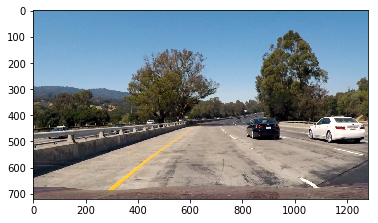

In [17]:
image = load_image("test_images/test1.jpg")
plt.imshow(image)

In [18]:
ystart = 400
ystop = 656
scale = 1.5
hog_channel = "ALL"

print(pix_per_cell)

rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

# find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

print(len(rectangles), 'rectangles found in image')

8
7 rectangles found in image


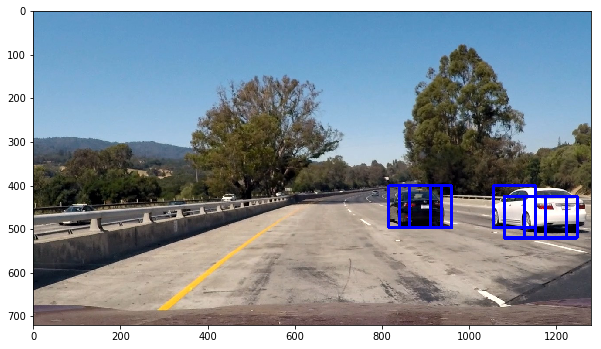

In [19]:
test_img_rects = draw_boxes(image, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

7 rectangles found in image
7 rectangles found in image
10 rectangles found in image


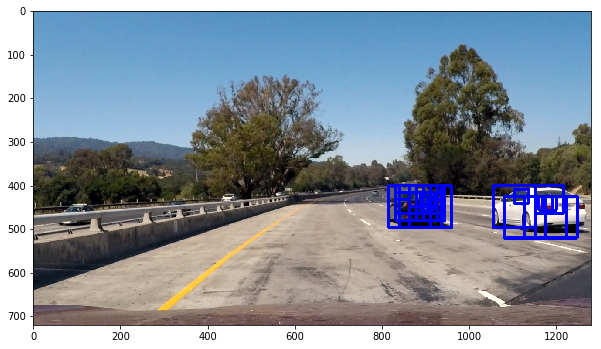

In [20]:
# The following is to find the diff window sizes and scale to best identify the cars

test_img = image

rectangles = []

ystart = 400
ystop = 656
scale = 1.5
x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
print(len(x), 'rectangles found in image')
rectangles.extend(x)
ystart = 400
ystop = 500
scale = 1.0
x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
print(len(x), 'rectangles found in image')
rectangles.extend(x)
ystart = 400
ystop = 500
scale = 0.5
x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
print(len(x), 'rectangles found in image')
rectangles.extend(x)
 
test_img_rects = draw_boxes(image, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)


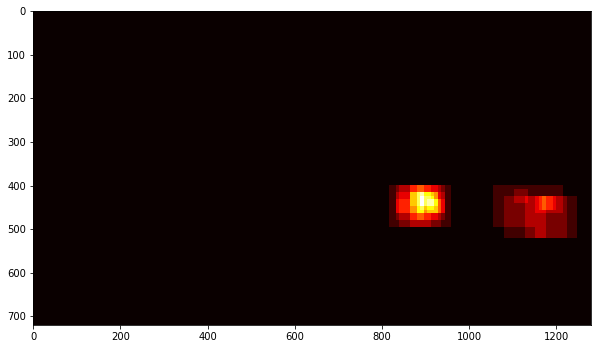

In [21]:
# Test out the heatmap
heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')


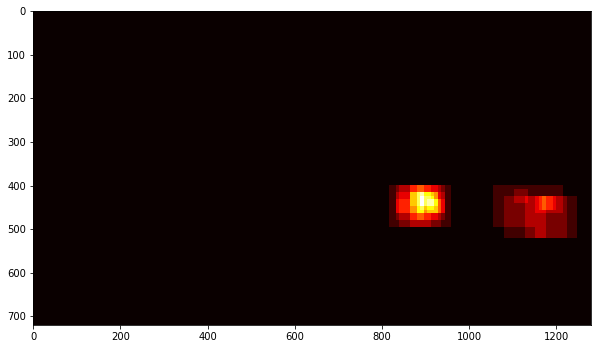

In [22]:
heatmap_img = apply_threshold(heatmap_img, 1)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')


2 cars found


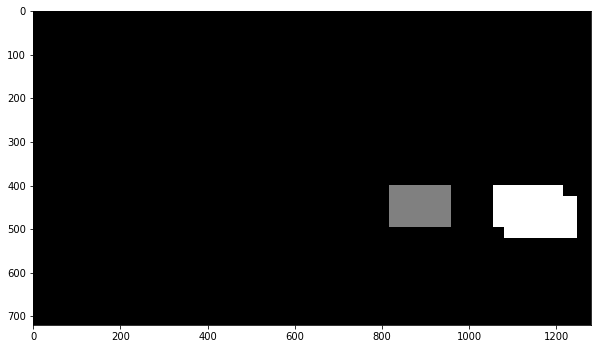

In [23]:
labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

In [24]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

# # Draw bounding boxes on a copy of the image
# draw_img = draw_labeled_bboxes(np.copy(image), labels)
# # Display the image
# plt.figure(figsize=(10,10))
# plt.imshow(draw_img)
# print('...')

In [37]:
def process(image, draw=False):
    
    test_img = image

    rectangles = []
    
    if draw:
        fig = plt.figure(figsize=(60, 60))

    ystart = 400
    ystop = 656
    scale = 1.5
    x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    print(len(x), 'rectangles found in image')
    rectangles.extend(x)
    ystart = 400
    ystop = 500
    scale = 1.0
    x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    print(len(x), 'rectangles found in image')
    rectangles.extend(x)
    ystart = 400
    ystop = 500
    scale = 0.5
    x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    print(len(x), 'rectangles found in image')
    rectangles.extend(x)

    if draw:
        img_rects = draw_boxes(image, rectangles)
        a=fig.add_subplot(3,3,1)
        a.set_title('Image with Boxes')
        plt.imshow(img_rects)
    
    # Test out the heatmap
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    
    if draw:
        a=fig.add_subplot(3,3,2)
        a.set_title('Heatmap')
        plt.imshow(heatmap_img, cmap='hot')
    
    heatmap_img = np.clip(heatmap_img, 0, 255)
    
    labels = label(heatmap_img)
    
    if draw:
        a=fig.add_subplot(3,3,3)
        a.set_title('Heatmap Labels')
        plt.imshow(labels[0], cmap='gray')
    
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    if draw:
        # Display the image
        a=fig.add_subplot(3,3,4)
        a.set_title('Detected Image')
        plt.imshow(draw_img)
    
    if draw:
        plot.show()
    
    return draw_img
    
    
    
    

7 rectangles found in image
7 rectangles found in image
10 rectangles found in image


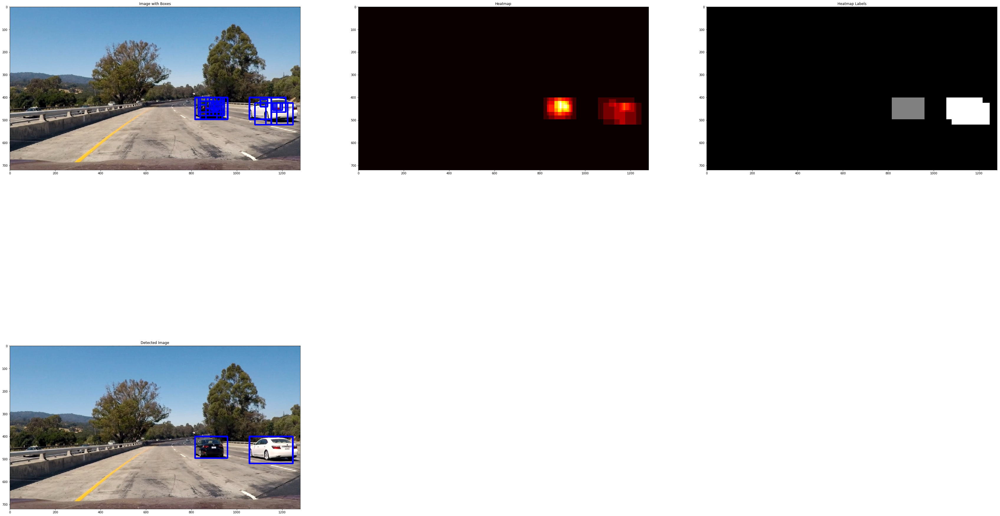

In [26]:
imgpath = "test_images/test1.jpg"
image = load_image(imgpath)
x = process(image, True)

7 rectangles found in image
7 rectangles found in image
10 rectangles found in image
0 rectangles found in image
0 rectangles found in image
0 rectangles found in image
0 rectangles found in image
2 rectangles found in image
1 rectangles found in image
8 rectangles found in image
5 rectangles found in image
10 rectangles found in image
6 rectangles found in image
9 rectangles found in image
12 rectangles found in image
11 rectangles found in image
10 rectangles found in image
6 rectangles found in image


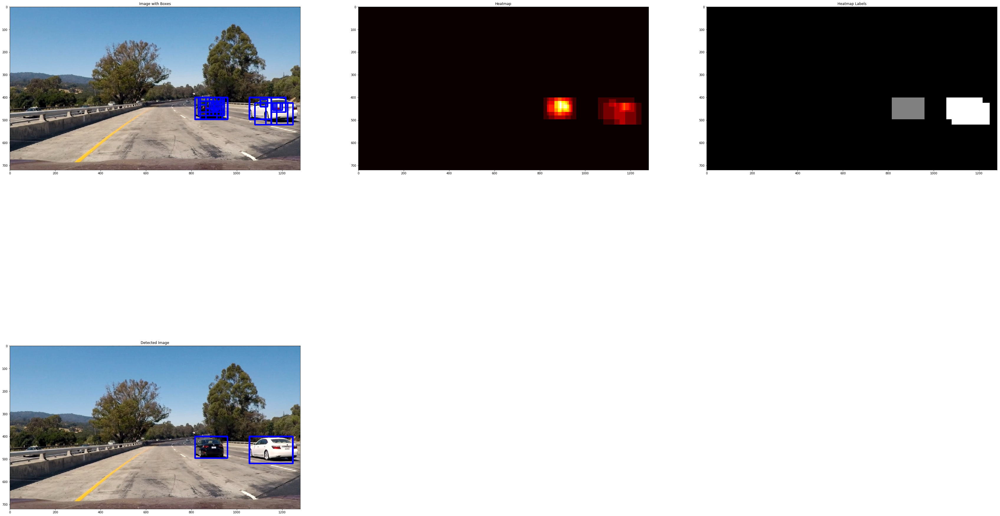

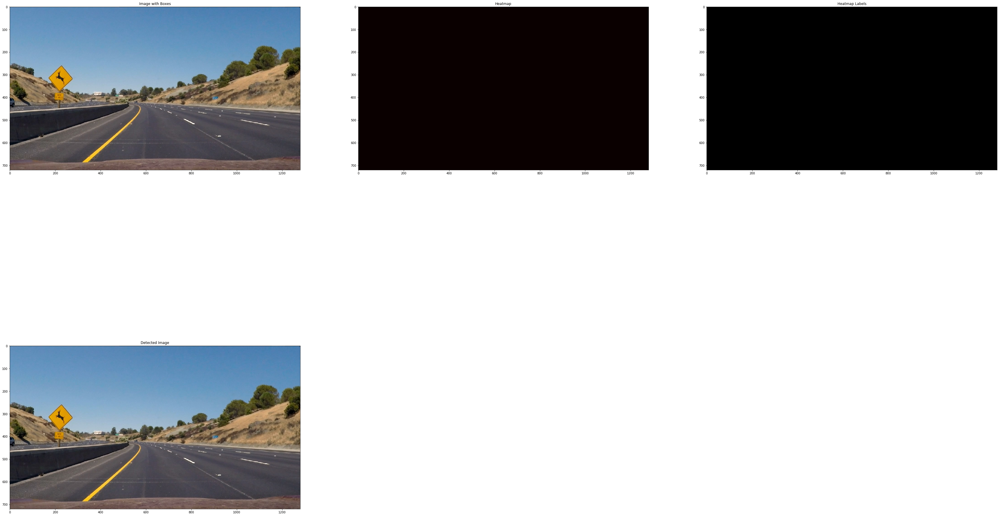

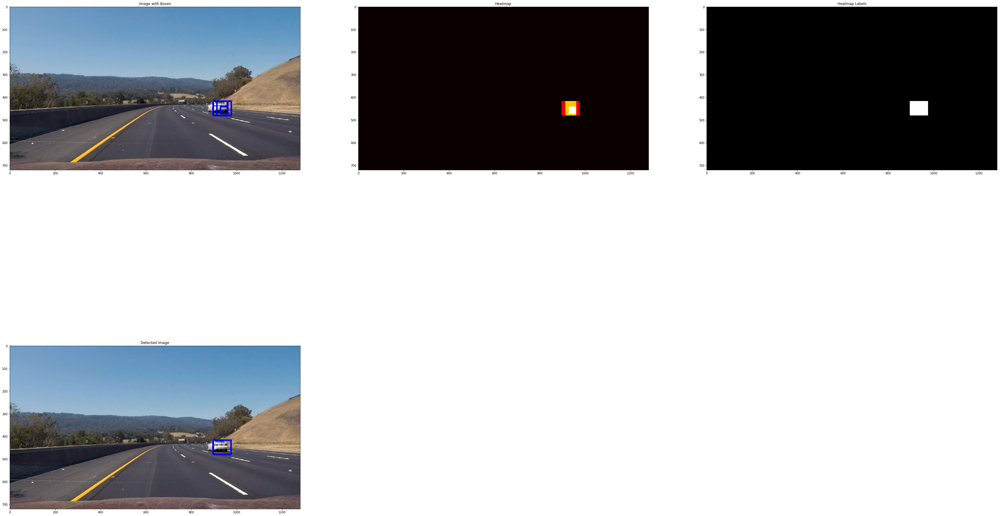

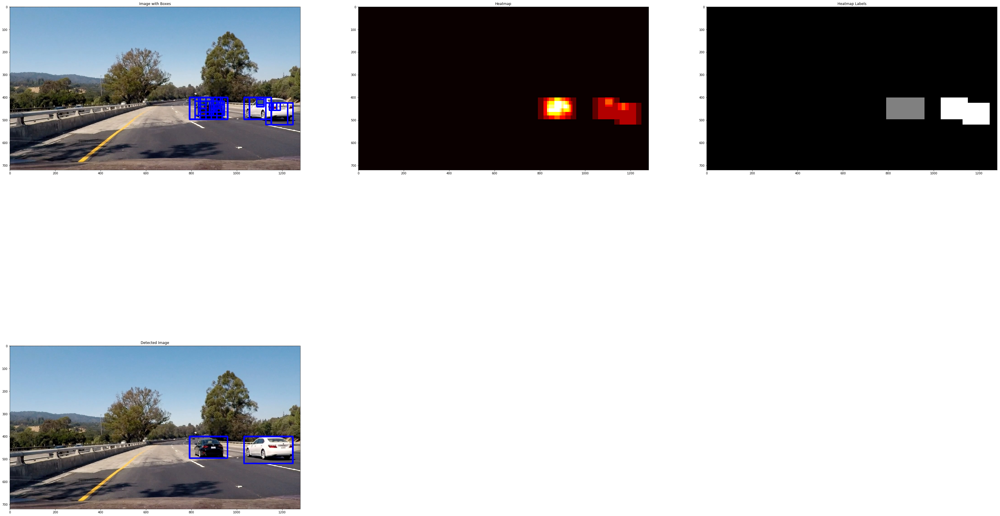

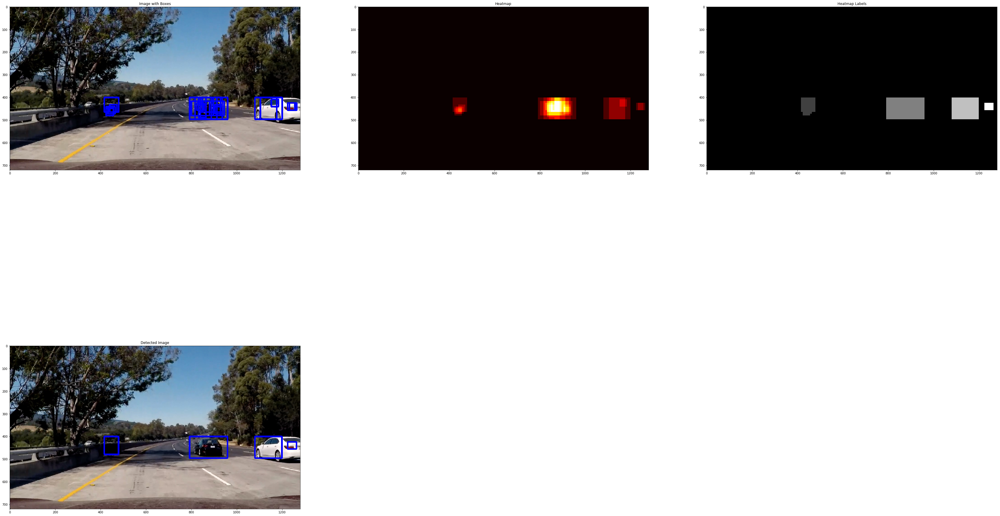

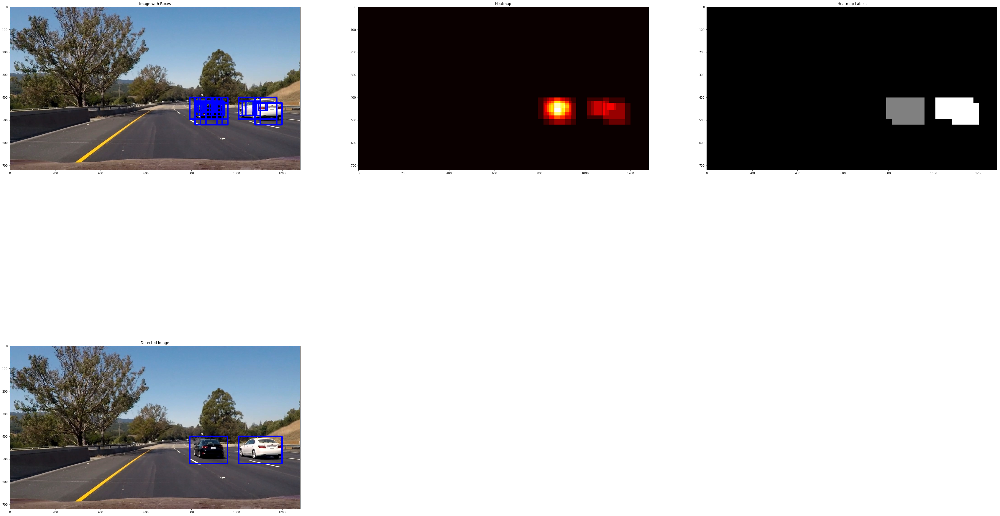

In [27]:
test_images = sorted(glob.glob('test_images/test*.jpg'))
for idx, im in enumerate(test_images):
    imgpath = im
    image = load_image(imgpath)
    process(image, True)

In [28]:
test_out_file = 'test_video_out1.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process)
%time clip_test_out.write_videofile(test_out_file, audio=False)

8 rectangles found in image
7 rectangles found in image
10 rectangles found in image
[MoviePy] >>>> Building video test_video_out1.mp4
[MoviePy] Writing video test_video_out1.mp4


  0%|          | 0/39 [00:00<?, ?it/s]

8 rectangles found in image
7 rectangles found in image


  3%|▎         | 1/39 [00:03<02:10,  3.43s/it]

10 rectangles found in image
9 rectangles found in image
8 rectangles found in image


  5%|▌         | 2/39 [00:06<02:06,  3.43s/it]

8 rectangles found in image
10 rectangles found in image
6 rectangles found in image


  8%|▊         | 3/39 [00:10<02:03,  3.42s/it]

3 rectangles found in image
8 rectangles found in image
4 rectangles found in image


 10%|█         | 4/39 [00:13<02:00,  3.44s/it]

6 rectangles found in image
10 rectangles found in image
5 rectangles found in image


 13%|█▎        | 5/39 [00:17<01:57,  3.45s/it]

6 rectangles found in image
8 rectangles found in image
5 rectangles found in image


 15%|█▌        | 6/39 [00:20<01:53,  3.45s/it]

5 rectangles found in image
12 rectangles found in image
4 rectangles found in image


 18%|█▊        | 7/39 [00:24<01:50,  3.44s/it]

4 rectangles found in image
10 rectangles found in image
7 rectangles found in image


 21%|██        | 8/39 [00:27<01:47,  3.46s/it]

5 rectangles found in image
9 rectangles found in image
6 rectangles found in image


 23%|██▎       | 9/39 [00:30<01:43,  3.44s/it]

5 rectangles found in image
9 rectangles found in image
8 rectangles found in image


 26%|██▌       | 10/39 [00:34<01:39,  3.44s/it]

6 rectangles found in image
7 rectangles found in image
7 rectangles found in image


 28%|██▊       | 11/39 [00:37<01:36,  3.43s/it]

7 rectangles found in image
7 rectangles found in image
6 rectangles found in image


 31%|███       | 12/39 [00:41<01:32,  3.43s/it]

5 rectangles found in image
9 rectangles found in image
6 rectangles found in image


 33%|███▎      | 13/39 [00:44<01:29,  3.44s/it]

5 rectangles found in image
7 rectangles found in image
6 rectangles found in image


 36%|███▌      | 14/39 [00:48<01:25,  3.44s/it]

9 rectangles found in image
12 rectangles found in image
5 rectangles found in image


 38%|███▊      | 15/39 [00:51<01:22,  3.44s/it]

10 rectangles found in image
12 rectangles found in image
4 rectangles found in image


 41%|████      | 16/39 [00:55<01:19,  3.44s/it]

7 rectangles found in image
13 rectangles found in image
4 rectangles found in image


 44%|████▎     | 17/39 [00:58<01:15,  3.43s/it]

8 rectangles found in image
12 rectangles found in image
4 rectangles found in image


 46%|████▌     | 18/39 [01:01<01:12,  3.43s/it]

6 rectangles found in image
11 rectangles found in image
5 rectangles found in image


 49%|████▊     | 19/39 [01:05<01:08,  3.43s/it]

5 rectangles found in image
14 rectangles found in image
8 rectangles found in image


 51%|█████▏    | 20/39 [01:08<01:05,  3.44s/it]

5 rectangles found in image
12 rectangles found in image
7 rectangles found in image


 54%|█████▍    | 21/39 [01:12<01:01,  3.43s/it]

4 rectangles found in image
10 rectangles found in image
5 rectangles found in image


 56%|█████▋    | 22/39 [01:15<00:58,  3.44s/it]

6 rectangles found in image
12 rectangles found in image
5 rectangles found in image


 59%|█████▉    | 23/39 [01:19<00:54,  3.44s/it]

3 rectangles found in image
7 rectangles found in image
5 rectangles found in image


 62%|██████▏   | 24/39 [01:22<00:51,  3.43s/it]

6 rectangles found in image
9 rectangles found in image
4 rectangles found in image


 64%|██████▍   | 25/39 [01:25<00:48,  3.43s/it]

6 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 67%|██████▋   | 26/39 [01:29<00:44,  3.44s/it]

7 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 69%|██████▉   | 27/39 [01:32<00:41,  3.44s/it]

10 rectangles found in image
9 rectangles found in image
5 rectangles found in image


 72%|███████▏  | 28/39 [01:36<00:37,  3.45s/it]

5 rectangles found in image
8 rectangles found in image
3 rectangles found in image


 74%|███████▍  | 29/39 [01:39<00:34,  3.47s/it]

6 rectangles found in image
8 rectangles found in image
5 rectangles found in image


 77%|███████▋  | 30/39 [01:43<00:31,  3.46s/it]

6 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 79%|███████▉  | 31/39 [01:46<00:27,  3.44s/it]

6 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 82%|████████▏ | 32/39 [01:50<00:24,  3.43s/it]

8 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 85%|████████▍ | 33/39 [01:53<00:20,  3.42s/it]

5 rectangles found in image
7 rectangles found in image
5 rectangles found in image


 87%|████████▋ | 34/39 [01:56<00:17,  3.44s/it]

5 rectangles found in image
7 rectangles found in image
5 rectangles found in image


 90%|████████▉ | 35/39 [02:00<00:13,  3.44s/it]

6 rectangles found in image
6 rectangles found in image
5 rectangles found in image


 92%|█████████▏| 36/39 [02:03<00:10,  3.44s/it]

4 rectangles found in image
8 rectangles found in image
5 rectangles found in image


 95%|█████████▍| 37/39 [02:07<00:06,  3.45s/it]

7 rectangles found in image
9 rectangles found in image
5 rectangles found in image


 97%|█████████▋| 38/39 [02:10<00:03,  3.45s/it]

6 rectangles found in image


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out1.mp4 

CPU times: user 2min 16s, sys: 1.72 s, total: 2min 17s
Wall time: 2min 11s


In [29]:
#Using smoothing by keeping track of heat maps for the last n frames
# Using 10 frames here
# Additionally, scale = 0.5 addded no benefit but increased time so not using it
# New pipeline is called process_with_smoothing_v1

In [30]:
# Define a class to store data from video
class Vehicle_Detection():
    def __init__(self):
        # history of rectangles previous n frames
        self.prev_rects = [] 
        self.nframes = 0
        
    def add_rects(self, rects):
        self.prev_rects.extend(rects)
        if len(self.prev_rects) > self.nframes:
            # throw out oldest rectangle set(s)
            self.prev_rects = self.prev_rects[len(self.prev_rects)-self.nframes:]



In [38]:
def process_with_smoothing_v1(image, draw=False):
    
    test_img = image

    rectangles = []
    
    if draw:
        fig = plt.figure(figsize=(60, 60))

    ystart = 400
    ystop = 656
    scale = 1.5
    x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    rectangles.extend(x)
    ystart = 400
    ystop = 500
    scale = 1.0
    x = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    rectangles.extend(x)

    detected.nframes = 10
    
    if len(rectangles) > 0:
        detected.add_rects(rectangles)

    if draw:
        img_rects = draw_boxes(image, rectangles)
        a=fig.add_subplot(3,3,1)
        a.set_title('Image with Boxes')
        plt.imshow(img_rects)
    
    # Test out the heatmap
    heatmap_img = np.zeros_like(test_img[:,:,0])
#     heatmap_img = add_heat(heatmap_img, rectangles)
    
    heatmap_img = add_heat(heatmap_img, detected.prev_rects)
    
    if draw:
        a=fig.add_subplot(3,3,2)
        a.set_title('Heatmap')
        plt.imshow(heatmap_img, cmap='hot')
        
    heatmap_img = apply_threshold(heatmap_img, 1)
    
    heatmap_img = np.clip(heatmap_img, 0, 255)
    
    labels = label(heatmap_img)
    
    if draw:
        a=fig.add_subplot(3,3,3)
        a.set_title('Heatmap Labels')
        plt.imshow(labels[0], cmap='gray')
    
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    if draw:
        # Display the image
        a=fig.add_subplot(3,3,4)
        a.set_title('Detected Image')
        plt.imshow(draw_img)
        
    if draw:
        plot.show()
    
    return draw_img
    

In [32]:
detected = Vehicle_Detection()

In [33]:
test_out_file = 'test_video_out_smooth1.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_with_smoothing_v1)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out_smooth1.mp4
[MoviePy] Writing video test_video_out_smooth1.mp4


 97%|█████████▋| 38/39 [00:38<00:01,  1.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_smooth1.mp4 

CPU times: user 41.6 s, sys: 156 ms, total: 41.7 s
Wall time: 39.8 s


In [34]:
detected = Vehicle_Detection()

In [ ]:
proj_out_file = 'project_video_out1.mp4'
clip_proj = VideoFileClip('project_video.mp4') #.subclip(23,26)  # subclip = only specified span of video
#clip_proj.save_frame('./test_images/project1.jpg', t=1.0) # saves the frame at time = t seconds
clip_proj_out = clip_proj.fl_image(process_with_smoothing_v1)
%time clip_proj_out.write_videofile(proj_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out1.mp4
[MoviePy] Writing video project_video_out1.mp4


100%|█████████▉| 1260/1261 [21:42<00:01,  1.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out1.mp4 

CPU times: user 23min 10s, sys: 6.16 s, total: 23min 16s
Wall time: 21min 43s


Using SVM based approach, the accuray is good, but the speed is an problem due to the fact of sliding window approach is time consuming! We could use image downsampling, multi-threads, or GPU processing to improve the speed. But, it would need a lot engineering work to make it run in real-time. 

Maybe a faster algo which is Neural Net based like YOLO would be better in real-time scenarios.

Overall, this project gave me insights into the varius tuning paramters and an understanding of classifiers.